## Objective 1: Import all necessary packages

In [1330]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

import warnings
warnings.filterwarnings('ignore')

print('Libraries imported.')

Libraries imported.


## Objective 2: Import AirBnB Listings

In [1478]:
df_listing = pd.read_csv('listings.csv')
print(df_listing.columns)
df_listing.drop(['id', 'name', 'host_id', 'host_name','neighbourhood_group',
       'minimum_nights', 'number_of_reviews', 'last_review', 'calculated_host_listings_count',
                ],axis=1,inplace=True)
df_listing['utilization_factor'] = df_listing.reviews_per_month/30 * df_listing.availability_365
df_listing.head()

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')


,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365,utilization_factor
0,Nrrebro,55.68798,12.54571,Private room,364,1.24,68,2.810667
1,Indre By,55.69163,12.57459,Entire home/apt,2400,0.59,310,6.096667
2,Vesterbro-Kongens Enghave,55.67069,12.55430,Entire home/apt,725,0.17,111,0.629000
3,Vesterbro-Kongens Enghave,55.66744,12.55516,Entire home/apt,750,0.14,179,0.835333
4,sterbro,55.71158,12.56879,Entire home/apt,618,0.06,275,0.550000


In [1479]:
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8528 entries, 0 to 8527
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   neighbourhood       8528 non-null   object 
 1   latitude            8528 non-null   float64
 2   longitude           8528 non-null   float64
 3   room_type           8528 non-null   object 
 4   price               8528 non-null   int64  
 5   reviews_per_month   7228 non-null   float64
 6   availability_365    8528 non-null   int64  
 7   utilization_factor  7228 non-null   float64
dtypes: float64(4), int64(2), object(2)
memory usage: 533.1+ KB


In [1475]:
df_listing.neighbourhood.replace(to_replace={'Nrrebro':'Norrebro',
                                             'sterbro':'Osterbro',
                                             'Amager st':'Amager East',
                                             'Vanlse':'Vanlose',
                                             'Brnshj-Husum':'Bronshoj',
                                             'Vesterbro-Kongens Enghave':'Vesterbro'},inplace=True)

In [1476]:
print(len(df_listing.neighbourhood.unique()))
df_listing.neighbourhood.unique()

11


array(['Norrebro', 'Indre By', 'Vesterbro', 'Osterbro', 'Frederiksberg',
       'Amager Vest', 'Amager East', 'Valby', 'Bispebjerg', 'Vanlose',
       'Bronshoj'], dtype=object)

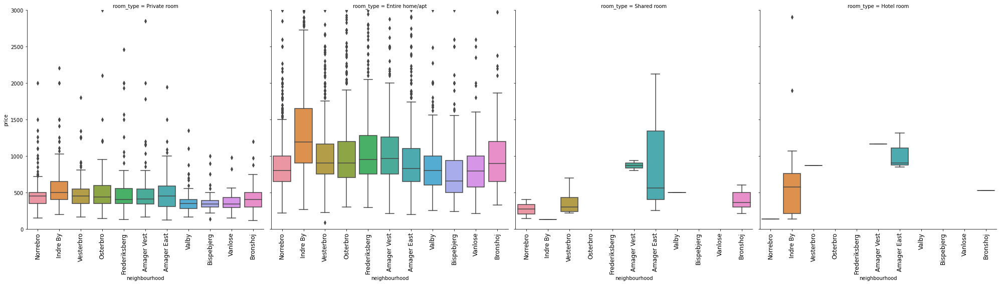

In [1477]:
g = sns.catplot(kind='box',x="neighbourhood", y="price",
            col="room_type", aspect=1, data=df_listing,size=7)
g.set(ylim=(0,3000),)
g.set_xticklabels(rotation=90,fontsize=12);

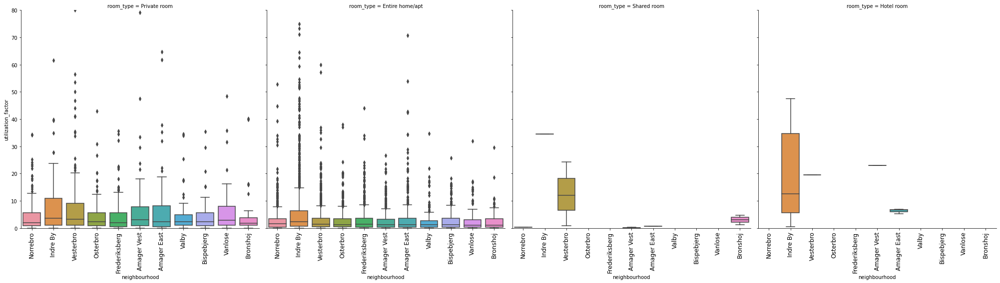

In [1342]:
g = sns.catplot(kind='box',x="neighbourhood", y="utilization_factor",
            col="room_type", aspect=1, data=df_listing,size=7)
g.set(ylim=(0,80),)
g.set_xticklabels(rotation=90,fontsize=12)
save;

## Objective 3: Narrowing down and cleaning the data

In [1343]:
room_listing = df_listing[df_listing.room_type =='Private room']
apt_listing = df_listing[df_listing.room_type =='Entire home/apt']
print(room_listing.shape)
print(apt_listing.shape)

(1433, 8)
(7047, 8)


In [1344]:
room_listing.head()

,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365,utilization_factor
0,Norrebro,55.68798,12.54571,Private room,364,1.24,68,2.810667
8,Norrebro,55.70491,12.55331,Private room,420,0.80,89,2.373333
15,Vesterbro,55.66476,12.54449,Private room,500,0.83,87,2.407000
23,Vesterbro,55.66479,12.54530,Private room,350,0.02,298,0.198667
25,Vesterbro,55.66933,12.54838,Private room,300,3.37,157,17.636333


In [1345]:
apt_listing.head()

,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365,utilization_factor
1,Indre By,55.69163,12.57459,Entire home/apt,2400,0.59,310,6.096667
2,Vesterbro,55.67069,12.55430,Entire home/apt,725,0.17,111,0.629000
3,Vesterbro,55.66744,12.55516,Entire home/apt,750,0.14,179,0.835333
4,Osterbro,55.71158,12.56879,Entire home/apt,618,0.06,275,0.550000
5,Indre By,55.68572,12.56749,Entire home/apt,2392,0.09,227,0.681000


In [1346]:
def remove_outliers(df):
    list_neighbourhood = df.neighbourhood.unique()
    return_df = pd.DataFrame()
    for hoods in list_neighbourhood:
        Q1 = df[df.neighbourhood == hoods].price.quantile(0.25)
        Q3 = df[df.neighbourhood == hoods].price.quantile(0.75)
        IQR = Q3 - Q1    #IQR is interquartile range. 

        upper = Q3 + 1.5 * IQR
        lower = Q1 - 1.5 *IQR
    
        filter_param = (df.price > lower) & (df.price < upper)
        filter_df = df[df.neighbourhood==hoods].loc[filter_param]
        return_df = pd.concat([return_df,filter_df])
        return_df = return_df[return_df.reviews_per_month>0]
    return return_df

In [1347]:
room_listing = remove_outliers(df=room_listing)

In [1481]:
room_listing.shape

(1104, 9)

In [1348]:
apt_listing = remove_outliers(df=apt_listing)

In [1482]:
apt_listing.shape

(5655, 9)

In [1349]:
df_listing = pd.concat([room_listing,apt_listing])

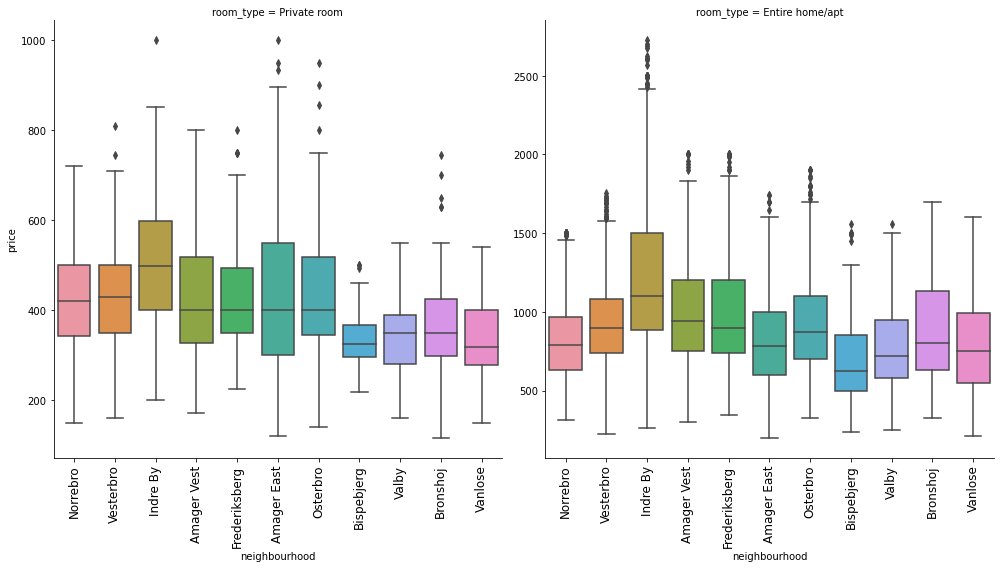

In [1352]:
g = sns.catplot(kind='box',
                x="neighbourhood",
                y="price",
                aspect=1,
                size=7,
                col='room_type',
                data=df_listing,
                sharey=False)
g.set_xticklabels(rotation=90,fontsize=12);

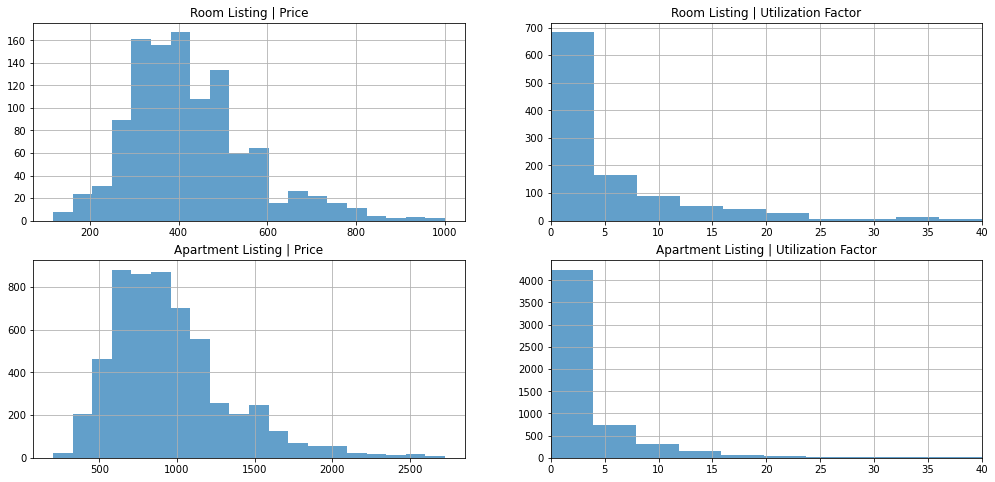

In [1489]:
fig, axs = plt.subplots(2,2,figsize=(17,8),sharex=False,sharey=False)

room_listing.price.hist(bins=20,ax=axs[0,0],alpha=0.7)
axs[0,0].set_title('Room Listing | Price')

room_listing.utilization_factor.hist(bins=20,ax=axs[0,1],alpha=0.7)
axs[0,1].set_title('Room Listing | Utilization Factor')
axs[0,1].set_xlim(0,40)

apt_listing.price.hist(bins=20,ax=axs[1,0],alpha=0.7)
axs[1,0].set_title('Apartment Listing | Price')

apt_listing.utilization_factor.hist(bins=55,ax=axs[1,1],alpha=0.7)
axs[1,1].set_title('Apartment Listing | Utilization Factor')
axs[1,1].set_xlim(0,40);

In [1469]:
def create_map(df,color,size=price*0.02):
    address = 'Copenhagen,Denmark'
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    print('The geograpical coordinate of Copenhagen are {}, {}.'.format(latitude, longitude))

    return_map = folium.Map(location=[latitude, longitude], zoom_start=12)

    for lat, long, price, hood, in zip(df['latitude'], df['longitude'], df['price'], df['neighbourhood']):
        label = 'Neighbourhood:\n{}\nAvePrice:DKK{}'.format(hood, price)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, long],
            radius=size,
            popup=label,
            color=color,
            fill=True,
            fill_color='yellow',
            fill_opacity=0.2,
            color_opacity=0.1,
            parse_html=False).add_to(return_map)
    return return_map

In [1470]:
create_map(df=room_listing,color='grey',size=price*0.02)

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


In [1471]:
create_map(df=apt_listing,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


## Objective 5: Making a dataframe of room and apartment listing that best represents the neighbourhood, which they belong

In [1395]:
room_listing.head()

,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365,utilization_factor
0,Norrebro,55.68798,12.54571,Private room,364,1.24,68,2.810667
8,Norrebro,55.70491,12.55331,Private room,420,0.80,89,2.373333
36,Norrebro,55.70635,12.55665,Private room,369,1.43,0,0.000000
60,Norrebro,55.69119,12.55308,Private room,719,0.28,9,0.084000
132,Norrebro,55.69428,12.55240,Private room,390,0.83,0,0.000000


In [1495]:
room_listing['price_category'] = pd.cut(room_listing.price,labels=['low','mid','high'],bins=3)
apt_listing['price_category'] = pd.cut(apt_listing.price,labels=['low','mid','high'],bins=3)

In [1496]:
rep_listing = pd.concat([room_listing,apt_listing])

In [1497]:
rep_listing.head()

,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365,utilization_factor,price_category
0,Norrebro,55.68798,12.54571,Private room,364,1.24,68,2.810667,low
8,Norrebro,55.70491,12.55331,Private room,420,0.80,89,2.373333,mid
36,Norrebro,55.70635,12.55665,Private room,369,1.43,0,0.000000,low
60,Norrebro,55.69119,12.55308,Private room,719,0.28,9,0.084000,high
132,Norrebro,55.69428,12.55240,Private room,390,0.83,0,0.000000,low


In [1498]:
rep_listing = rep_listing.groupby(['neighbourhood','price_category','room_type']).mean().dropna().reset_index()

In [1505]:
rep_listing.loc[rep_listing.room_type=='Private room']

,neighbourhood,price_category,room_type,latitude,longitude,price,reviews_per_month,availability_365,utilization_factor
1,Amager East,low,Private room,55.658522,12.616983,298.078431,1.424706,142.156863,8.189124
3,Amager East,mid,Private room,55.657664,12.616852,535.878049,0.923415,186.463415,5.703919
4,Amager East,high,Private room,55.651583,12.621577,854.777778,0.383333,282.444444,2.306704
6,Amager Vest,low,Private room,55.648101,12.589732,322.280702,1.321228,170.175439,7.326246
8,Amager Vest,mid,Private room,55.651483,12.583198,522.744186,1.084884,167.209302,5.894178
10,Amager Vest,high,Private room,55.653867,12.586152,764.166667,0.471667,280.166667,5.464611
12,Bispebjerg,low,Private room,55.707964,12.532362,317.117647,0.802353,192.549020,4.529085
14,Bispebjerg,mid,Private room,55.706983,12.536771,462.875000,0.917500,146.875000,4.965750
16,Bronshoj,low,Private room,55.709891,12.480253,312.566667,1.147333,189.333333,6.030944
18,Bronshoj,mid,Private room,55.706965,12.490762,543.300000,0.326000,219.800000,1.459433


### Objective 6: Using Foursquare API to identify venues in the Neighbourhood

In [1401]:
CLIENT_ID = 'PN4AFMPRP5DONH0QPH2EORSOCCS3NCDLC5P5MNBL0TSOMBUT' # your Foursquare ID
CLIENT_SECRET = 'GM0YG53BODJHSKWT4OBF5SCC05XJ0PEID0G0CJI14KOAPTVB' # your Foursquare Secret
VERSION = '20201103' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: PN4AFMPRP5DONH0QPH2EORSOCCS3NCDLC5P5MNBL0TSOMBUT
CLIENT_SECRET:GM0YG53BODJHSKWT4OBF5SCC05XJ0PEID0G0CJI14KOAPTVB


In [1402]:
def getNearbyVenues(names, latitudes, longitudes,radius):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['neighbourhood', 
                  'neighbourhood latitude', 
                  'neighbourhood longitude', 
                  'venue', 
                  'venue latitude', 
                  'venue longitude', 
                  'venue category']
    
    return(nearby_venues)

In [1403]:
LIMIT = 100
radius = 500
cph_venues = getNearbyVenues(names=rep_listing['neighbourhood'],
                                   latitudes=rep_listing['latitude'],
                                   longitudes=rep_listing['longitude'],
                                   radius = radius
                                  )

Amager East
Amager East
Amager East
Amager East
Amager East
Amager Vest
Amager Vest
Amager Vest
Amager Vest
Amager Vest
Amager Vest
Bispebjerg
Bispebjerg
Bispebjerg
Bispebjerg
Bronshoj
Bronshoj
Bronshoj
Bronshoj
Bronshoj
Frederiksberg
Frederiksberg
Frederiksberg
Frederiksberg
Frederiksberg
Frederiksberg
Indre By
Indre By
Indre By
Indre By
Indre By
Indre By
Norrebro
Norrebro
Norrebro
Norrebro
Norrebro
Osterbro
Osterbro
Osterbro
Osterbro
Osterbro
Osterbro
Valby
Valby
Valby
Valby
Vanlose
Vanlose
Vanlose
Vanlose
Vesterbro
Vesterbro
Vesterbro
Vesterbro
Vesterbro


In [1508]:
cph_venues = cph_venues.drop_duplicates()
cph_venues.head(20)

,neighbourhood,neighbourhood latitude,neighbourhood longitude,venue,venue latitude,venue longitude,venue category
0,Amager East,55.659333,12.615439,Amager Bio,55.657532,12.609537,Concert Hall
1,Amager East,55.659333,12.615439,Mad & Kaffe Amagerbro,55.659117,12.608121,Breakfast Spot
2,Amager East,55.659333,12.615439,Crossfit Copenhagen - Boxen,55.660236,12.607988,Gym / Fitness Center
3,Amager East,55.659333,12.615439,Uggi's Coffee,55.658355,12.607681,Coffee Shop
4,Amager East,55.659333,12.615439,Beta,55.658234,12.609033,Rock Club
5,Amager East,55.659333,12.615439,Lergravsparken,55.662258,12.616792,Park
6,Amager East,55.659333,12.615439,Fitness World,55.661443,12.610136,Gym / Fitness Center
7,Amager East,55.659333,12.615439,Gnam Gnam,55.656433,12.609346,Italian Restaurant
8,Amager East,55.659333,12.615439,Gastronomia Italiana,55.660295,12.612779,Pizza Place
9,Amager East,55.659333,12.615439,Jagger,55.657765,12.608207,Burger Joint


In [1405]:
print('There are {} uniques categories.'.format(len(cph_venues['venue category'].unique())))

There are 160 uniques categories.


### Objective 7: Exploring the Neighbourhood of Copenhagen

In [1406]:
cph_onehot = pd.get_dummies(cph_venues[['venue category']], prefix= "", prefix_sep= " ")

# # add neighborhood column back to dataframe
cph_onehot['neighbourhood'] = cph_venues['neighbourhood'] 
# move neighborhood column to the first column
fixed_columns = [cph_onehot.columns[-1]] + list(cph_onehot.columns[:-1])
cph_onehot =cph_onehot[fixed_columns]
print(cph_onehot.shape)
cph_onehot.head()

(2029, 161)


,neighbourhood,African Restaurant,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Australian Restaurant,Bagel Shop,Bakery,Bar,Basketball Court,Beer Bar,Beer Garden,Beer Store,Bistro,Bookstore,Breakfast Spot,Burger Joint,Bus Station,Butcher,Café,Camera Store,Candy Store,Castle,Cemetery,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doner Restaurant,Electronics Store,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Furniture / Home Store,Garden,Gas Station,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Library,Light Rail Station,Liquor Store,Lounge,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Movie Theater,Multiplex,Music Store,Music Venue,National Park,Neighborhood,Palace,Park,Pedestrian Plaza,Pharmacy,Pie Shop,Pizza Place,Platform,Playground,Plaza,Pool,Pub,Ramen Restaurant,Record Shop,Restaurant,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Soccer Stadium,South American Restaurant,Spa,Sporting Goods Shop,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Stadium,Thai Restaurant,Theater,Toy / Game Store,Track,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Amager East,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Amager East,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Amager East,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Amager East,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Amager East,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [1409]:
cph_grouped = cph_onehot.groupby('neighbourhood').sum().reset_index()
print(cph_grouped.shape)
cph_grouped

(11, 161)


,neighbourhood,African Restaurant,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Australian Restaurant,Bagel Shop,Bakery,Bar,Basketball Court,Beer Bar,Beer Garden,Beer Store,Bistro,Bookstore,Breakfast Spot,Burger Joint,Bus Station,Butcher,Café,Camera Store,Candy Store,Castle,Cemetery,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doner Restaurant,Electronics Store,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Furniture / Home Store,Garden,Gas Station,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Library,Light Rail Station,Liquor Store,Lounge,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Movie Theater,Multiplex,Music Store,Music Venue,National Park,Neighborhood,Palace,Park,Pedestrian Plaza,Pharmacy,Pie Shop,Pizza Place,Platform,Playground,Plaza,Pool,Pub,Ramen Restaurant,Record Shop,Restaurant,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Soccer Stadium,South American Restaurant,Spa,Sporting Goods Shop,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Stadium,Thai Restaurant,Theater,Toy / Game Store,Track,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Amager East,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,0,0,0,0,0,0,3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,0,2,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,4,0,2,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,Amager Vest,0,0,0,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Bispebjerg,0,0,0,0,0,1,1,0,0,10,4,0,8,0,0,0,0,0,0,3,0,10,0,1,0,0,0,1,0,3,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,3,3,0,0,1,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,6,0,0,0,0,1,0,0,1,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,3,0,4,0,0,0,0,0,0,0,0,1,0,0,0,0
3,Bronshoj,0,0,0,0,1,0,0,0,0,1,2,0,0,0,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,4,0,0,0,0,0,0,0,0,0,1,0,3,0,0,0,0,8,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,0,3,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,6,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Frederiksberg,0,0,4,1,0,0,2,0,5,23,9,0,0,3,0,0,3,0,13,0,0,29,0,0,1,0,0,1,0,6,0,0,0,0,0,1,1,0,3,0,0,0,0,0,9,0,0,0,0,0,0,0,2,0,0,0,0,8,0,2,0,0,1,0,1,2,1,1,0,0,0,0,0,0,4,0,1,14,0,0,0,1,0,0,0,0,0,5,0,0,5,0,0,0,0,0,0,0,0,0,0,0,5,0,1,1,0,0,4,0,1,0,9,0,5,7,2,4,0,3,9,0,0,5,0,0,12,1,0,0,0,0,5,0,0,0,0,1,0,0,2,8,0,0,0,1,3,4,0,0,0,0,0,0,0,4,0,0,1,4
5,Indre By,0,0,5,5,10,0,6,2,0,5,19,0,1,0,0,6,8,11,15,0,4,11,1,0,0,0,6,38,26,38,0,0,5,0,0,0,5,6,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,33,21,1,0,

In [1410]:
cph_neighbourhood = cph_grouped.transpose()
cph_neighbourhood.columns = cph_neighbourhood.iloc[0,:]
cph_neighbourhood = cph_neighbourhood.drop('neighbourhood',axis=0)

In [1411]:
cph_neighbourhood.head()

neighbourhood,Amager East,Amager Vest,Bispebjerg,Bronshoj,Frederiksberg,Indre By,Norrebro,Osterbro,Valby,Vanlose,Vesterbro
African Restaurant,0,0,0,0,0,0,2,0,0,0,0
American Restaurant,1,0,0,0,0,0,0,0,0,0,0
Art Gallery,0,0,0,0,4,5,3,0,0,0,1
Art Museum,0,0,0,0,1,5,0,0,0,0,0
Arts & Crafts Store,0,0,0,1,0,10,6,0,0,0,0


In [1200]:
import re

In [1412]:
cph_restaurant = cph_neighbourhood[cph_neighbourhood.index.str.contains('restaurant',
                                                                        flags=re.IGNORECASE,
                                                                        regex=True)].sum(axis=0)
cph_cafe = cph_neighbourhood[cph_neighbourhood.index.str.contains('Bakery|Breakfast|Coffee|Cafe',
                                                                        flags=re.IGNORECASE,
                                                                        regex=True)].sum(axis=0)
cph_fastfood = cph_neighbourhood[cph_neighbourhood.index.str.contains('Fast|Salad|Bagel|Pizza|Sandwich|Deli',
                                                                        flags=re.IGNORECASE,
                                                                        regex=True)].sum(axis=0)
cph_art = cph_neighbourhood[cph_neighbourhood.index.str.contains('Art|Museum|Gallery|Theatre|Music|Castle',
                                                                        flags=re.IGNORECASE,
                                                                        regex=True)].sum(axis=0)
cph_activity = cph_neighbourhood[cph_neighbourhood.index.str.contains('Park|Landmark|Playground|Zoo',
                                                                        flags=re.IGNORECASE,
                                                                        regex=True)].sum(axis=0)
cph_drink = cph_neighbourhood[cph_neighbourhood.index.str.contains('Pub|Bar|Beer|Wine|Bodega|',
                                                                        flags=re.IGNORECASE,
                                                                        regex=True)].sum(axis=0)

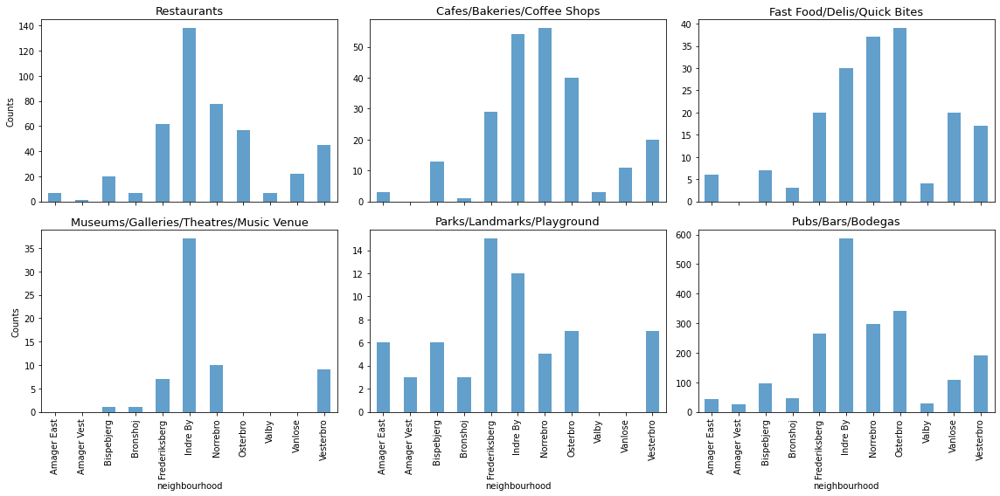

In [1413]:
fig, axs = plt.subplots(2,3,figsize=(16,8),sharex=True)
cph_restaurant.plot(kind='bar',ax=axs[0,0],alpha=0.7)
axs[0,0].set_title('Restaurants',fontsize=13)
cph_cafe.plot(kind='bar',ax=axs[0,1],alpha=0.7)
axs[0,1].set_title('Cafes/Bakeries/Coffee Shops',fontsize=13)
cph_fastfood.plot(kind='bar',ax=axs[0,2],alpha=0.7)
axs[0,2].set_title('Fast Food/Delis/Quick Bites',fontsize=13)
cph_art.plot(kind='bar',ax=axs[1,0],alpha=0.7)
axs[1,0].set_title('Museums/Galleries/Theatres/Music Venue',fontsize=13)
cph_activity.plot(kind='bar',ax=axs[1,1],alpha=0.7)
axs[1,1].set_title('Parks/Landmarks/Playground',fontsize=13)
cph_drink.plot(kind='bar',ax=axs[1,2],alpha=0.7)
axs[1,2].set_title('Pubs/Bars/Bodegas',fontsize=13)
axs[0,0].set_ylabel('Counts')
axs[1,0].set_ylabel('Counts')
fig.tight_layout();

## Objective 8: Clustering the room_listing with Foursquare API data

In [1430]:
df_room_cluster_1 = pd.merge(room_listing,cph_grouped,on='neighbourhood')
df_room_cluster_1 = df_room_cluster_1.drop(labels=['neighbourhood',
                                                 'latitude',
                                                 'longitude',
                                                 'room_type',
                                                 'price_category',
                                                 'price',
                                                   'reviews_per_month',
                                                   'utilization_factor',
                                                   'availability_365',
                                                  ],axis=1)

In [1432]:
## scale
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()

In [1433]:
scaled_room_cluster_1 = scale.fit_transform(df_room_cluster_1)

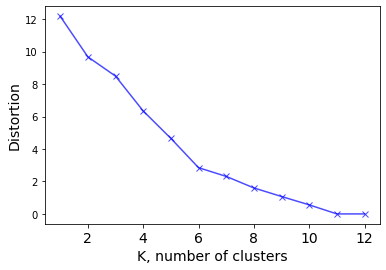

In [1510]:
# k means determine k
distortions = []
K = range(1,13)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(scaled_room_cluster_1)
    kmeanModel.fit(scaled_room_cluster_1)
    distortions.append(sum(np.min(cdist(scaled_room_cluster_1, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / scaled_room_cluster_2.shape[0])

# Plot the elbow
fig, ax = plt.subplots()
ax.plot(K, distortions, 'bx-',alpha=0.7)
ax.set_xlabel('K, number of clusters',fontsize=14)
ax.set_ylabel('Distortion',fontsize=14)
plt.xticks(fontsize=14);

In [1435]:
# set number of clusters
kclusters = 6

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(df_room_cluster_1)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:len(df_room_cluster.index)]

array([4, 4, 4, ..., 2, 2, 2])

In [1436]:
room_labeled_1 = room_listing.copy()
room_labeled_1['cluster_labels'] = kmeans.labels_

In [1511]:
# create map
map_clusters = folium.Map(location=[55.6867243, 12.5700724], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.tab10(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, price_cat, price in zip(room_labeled_1['latitude'],
                                                    room_labeled_1['longitude'],
                                                    room_labeled_1['neighbourhood'],
                                                    room_labeled_1['cluster_labels'],
                                                    room_labeled_1['price_category'],
                                                    room_labeled_1['price']):
    label = folium.Popup(str(poi) + '\nCluster: ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=price*0.01,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Objective 9: Clustering the room_listing with price and reviews_per_month included

In [1443]:
df_room_cluster_2 = pd.merge(room_listing,cph_grouped,on='neighbourhood')
df_room_cluster_2 = df_room_cluster_2.drop(labels=['neighbourhood','latitude','longitude','room_type','price_category','reviews_per_month','availability_365'],axis=1)

In [1444]:
df_room_cluster_2.head()

,price,utilization_factor,African Restaurant,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Australian Restaurant,Bagel Shop,Bakery,Bar,Basketball Court,Beer Bar,Beer Garden,Beer Store,Bistro,Bookstore,Breakfast Spot,Burger Joint,Bus Station,Butcher,Café,Camera Store,Candy Store,Castle,Cemetery,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doner Restaurant,Electronics Store,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Furniture / Home Store,Garden,Gas Station,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Lake,Library,Light Rail Station,Liquor Store,Lounge,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Movie Theater,Multiplex,Music Store,Music Venue,National Park,Neighborhood,Palace,Park,Pedestrian Plaza,Pharmacy,Pie Shop,Pizza Place,Platform,Playground,Plaza,Pool,Pub,Ramen Restaurant,Record Shop,Restaurant,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Soccer Stadium,South American Restaurant,Spa,Sporting Goods Shop,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tennis Stadium,Thai Restaurant,Theater,Toy / Game Store,Track,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,364,2.810667,2,0,3,0,6,0,0,0,0,23,6,0,15,0,3,3,1,11,5,0,0,11,0,4,0,4,4,2,3,22,0,1,0,0,0,1,0,0,0,0,0,0,2,0,0,0,5,4,0,8,0,0,0,1,0,0,0,0,0,0,0,3,0,0,5,1,0,8,0,0,0,0,0,8,0,0,0,6,5,0,0,0,0,2,0,0,0,0,0,4,0,0,0,0,0,0,2,0,4,0,0,4,0,0,1,0,0,0,2,0,1,0,12,0,3,2,0,1,0,1,6,0,0,4,1,2,6,0,0,0,8,0,0,0,0,0,1,0,0,0,2,7,0,0,1,0,12,0,0,0,0,1,1,1,19,0,0,0,0,0
1,420,2.373333,2,0,3,0,6,0,0,0,0,23,6,0,15,0,3,3,1,11,5,0,0,11,0,4,0,4,4,2,3,22,0,1,0,0,0,1,0,0,0,0,0,0,2,0,0,0,5,4,0,8,0,0,0,1,0,0,0,0,0,0,0,3,0,0,5,1,0,8,0,0,0,0,0,8,0,0,0,6,5,0,0,0,0,2,0,0,0,0,0,4,0,0,0,0,0,0,2,0,4,0,0,4,0,0,1,0,0,0,2,0,1,0,12,0,3,2,0,1,0,1,6,0,0,4,1,2,6,0,0,0,8,0,0,0,0,0,1,0,0,0,2,7,0,0,1,0,12,0,0,0,0,1,1,1,19,0,0,0,0,0
2,369,0.000000,2,0,3,0,6,0,0,0,0,23,6,0,15,0,3,3,1,11,5,0,0,11,0,4,0,4,4,2,3,22,0,1,0,0,0,1,0,0,0,0,0,0,2,0,0,0,5,4,0,8,0,0,0,1,0,0,0,0,0,0,0,3,0,0,5,1,0,8,0,0,0,0,0,8,0,0,0,6,5,0,0,0,0,2,0,0,0,0,0,4,0,0,0,0,0,0,2,0,4,0,0,4,0,0,1,0,0,0,2,0,1,0,12,0,3,2,0,1,0,1,6,0,0,4,1,2,6,0,0,0,8,0,0,0,0,0,1,0,0,0,2,7,0,0,1,0,12,0,0,0,0,1,1,1,19,0,0,0,0,0
3,719,0.084000,2,0,3,0,6,0,0,0,0,23,6,0,15,0,3,3,1,11,5,0,0,11,0,4,0,4,4,2,3,22,0,1,0,0,0,1,0,0,0,0,0,0,2,0,0,0,5,4,0,8,0,0,0,1,0,0,0,0,0,0,0,3,0,0,5,1,0,8,0,0,0,0,0,8,0,0,0,6,5,0,0,0,0,2,0,0,0,0,0,4,0,0,0,0,0,0,2,0,4,0,0,4,0,0,1,0,0,0,2,0,1,0,12,0,3,2,0,1,0,1,6,0,0,4,1,2,6,0,0,0,8,0,0,0,0,0,1,0,0,0,2,7,0,0,1,0,12,0,0,0,0,1,1,1,19,0,0,0,0,0
4,390,0.000000,2,0,3,0,6,0,0,0,0,23,6,0,15,0,3,3,1,11,5,0,0,11,0,4,0,4,4,2,3,22,0,1,0,0,0,1,0,0,0,0,0,0,2,0,0,0,5,4,0,8,0,0,0,1,0,0,0,0,0,0,0,3,0,0,5,1,0,8,0,0,0,0,0,8,0,0,0,6,5,0,0,0,0,2,0,0,0,0,0,4,0,0,0,0,0,0,2,0,4,0,0,4,0,0,1,0,0,0,2,0,1,0,12,0,3,2,0,1,0,1,6,0,0,4,1,2,6,0,0,0,8,0,0,0,0,0,1,0,0,0,2,7,0,0,1,0,12,0,0,0,0,1,1,1,19,0,0,0,0,0


In [1445]:
scaled_room_cluster_2 = scale.fit_transform(df_room_cluster_2)

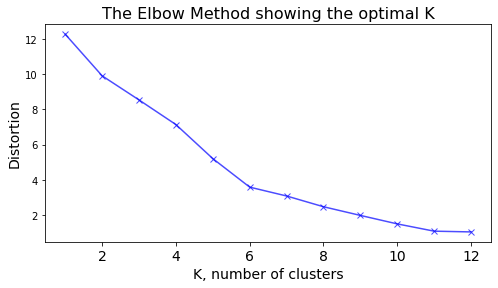

In [1446]:
# k means determine k
distortions = []
K = range(1,13)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(scaled_room_cluster_2)
    kmeanModel.fit(scaled_room_cluster_2)
    distortions.append(sum(np.min(cdist(scaled_room_cluster_2, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / scaled_room_cluster_2.shape[0])

# Plot the elbow
fig, ax = plt.subplots(figsize=(8,4))
ax.plot(K, distortions, 'bx-',alpha=0.7)
ax.set_xlabel('K, number of clusters',fontsize=14)
ax.set_ylabel('Distortion',fontsize=14)
ax.set_title('The Elbow Method showing the optimal K',fontsize=16)
plt.xticks(fontsize=14);

### k = 6

In [1447]:
# set number of clusters
kclusters = 6

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(df_room_cluster_2)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:len(df_room_cluster_2.index)]

array([5, 5, 5, ..., 1, 0, 5])

In [1448]:
room_labeled_2 = room_listing.copy()
room_labeled_2['cluster_labels'] = kmeans.labels_

mapping the cluster

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.

In [1512]:
# create map
map_clusters = folium.Map(location=[55.6867243, 12.5700724], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.tab10(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, price_cat, price in zip(room_labeled_2['latitude'],
                                                    room_labeled_2['longitude'],
                                                    room_labeled_2['neighbourhood'],
                                                    room_labeled_2['cluster_labels'],
                                                    room_labeled_2['price_category'],
                                                    room_labeled_2['price']):
    label = folium.Popup(str(poi) + '\nCluster: ' + str(cluster) +'\nPrice Category: ' + str(price_cat), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=price*0.01,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Objective 10: Understanding different Clusters

In [1451]:
room_labeled_2.head()

,neighbourhood,latitude,longitude,room_type,price,reviews_per_month,availability_365,utilization_factor,price_category,cluster_labels
0,Norrebro,55.68798,12.54571,Private room,364,1.24,68,2.810667,low,5
8,Norrebro,55.70491,12.55331,Private room,420,0.80,89,2.373333,mid,5
36,Norrebro,55.70635,12.55665,Private room,369,1.43,0,0.000000,low,5
60,Norrebro,55.69119,12.55308,Private room,719,0.28,9,0.084000,high,2
132,Norrebro,55.69428,12.55240,Private room,390,0.83,0,0.000000,low,5


Cluster 1

In [1452]:
room_cluster_1 = room_labeled_2.loc[room_labeled['cluster_labels']==0]
room_grouped_1 =room_cluster_1.groupby(['neighbourhood']).median().dropna().drop(['cluster_labels',
                                                                                  'longitude',
                                                                                  'latitude'],
                                                                                   axis=1).reset_index()
room_grouped_1

,neighbourhood,price,reviews_per_month,availability_365,utilization_factor
0,Amager East,300.0,0.920,97.0,2.731667
1,Amager Vest,302.0,0.995,90.0,2.478333
2,Bispebjerg,309.0,0.580,268.0,2.322667
3,Bronshoj,299.0,0.840,177.0,1.810000
4,Frederiksberg,300.0,0.700,35.0,1.994667
5,Indre By,319.0,1.375,147.0,7.777667
6,Norrebro,300.0,0.990,87.0,1.247000
7,Osterbro,290.5,1.900,140.0,8.608500
8,Valby,299.0,0.360,170.0,1.652000
9,Vanlose,300.0,0.830,90.0,2.407000


In [1453]:
create_map(df=room_cluster_1,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


Cluster 2

In [1454]:
room_cluster_2 = room_labeled_2.loc[room_labeled['cluster_labels']==1]
room_grouped_2 =room_cluster_2.groupby(['neighbourhood']).median().dropna().drop(['cluster_labels',
                                                                                  'longitude',
                                                                                  'latitude'],
                                                                                   axis=1).reset_index()
room_grouped_2

,neighbourhood,price,reviews_per_month,availability_365,utilization_factor
0,Amager East,580.0,0.525,170.0,2.450500
1,Amager Vest,595.0,0.540,180.0,4.489333
2,Bronshoj,629.5,0.120,364.5,1.458167
3,Frederiksberg,600.0,0.225,55.5,0.541833
4,Indre By,595.0,0.880,171.0,3.650000
5,Norrebro,600.0,0.330,176.0,1.440000
6,Osterbro,600.0,0.370,179.0,1.114667
7,Valby,550.0,1.670,321.0,17.368000
8,Vanlose,540.0,3.800,250.0,31.666667
9,Vesterbro,599.0,0.490,145.0,2.634667


In [1455]:
create_map(df=room_cluster_2,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


Cluster 3

In [1457]:
room_cluster_3 = room_labeled_2.loc[room_labeled['cluster_labels']==2]
room_grouped_3 =room_cluster_3.groupby(['neighbourhood']).median().dropna().drop(['cluster_labels',
                                                                                  'longitude',
                                                                                  'latitude'],
                                                                                   axis=1).reset_index()
room_grouped_3

,neighbourhood,price,reviews_per_month,availability_365,utilization_factor
0,Amager East,498.0,0.800,121.0,2.400000
1,Amager Vest,475.0,0.860,88.0,2.484000
2,Bispebjerg,460.0,0.850,88.0,2.181667
3,Bronshoj,450.0,0.455,213.5,1.352000
4,Frederiksberg,484.0,0.700,179.0,3.420000
5,Indre By,495.0,1.110,90.0,3.300000
6,Norrebro,499.0,0.970,146.0,3.281667
7,Osterbro,497.5,0.500,160.0,1.492500
8,Valby,500.0,0.510,89.0,2.292333
9,Vanlose,499.0,0.355,174.0,2.355000


In [1458]:
create_map(df=room_cluster_3,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


Cluster 4

In [1459]:
room_cluster_4 = room_labeled_2.loc[room_labeled['cluster_labels']==3]
room_grouped_4 =room_cluster_4.groupby(['neighbourhood']).median().dropna().drop(['cluster_labels',
                                                                                  'longitude',
                                                                                  'latitude'],
                                                                                   axis=1).reset_index()
room_grouped_4

,neighbourhood,price,reviews_per_month,availability_365,utilization_factor
0,Amager East,200.0,1.130,56.0,1.376000
1,Amager Vest,230.0,0.610,125.0,3.240000
2,Bispebjerg,250.0,0.280,243.0,1.944000
3,Bronshoj,230.0,0.585,195.0,2.367833
4,Frederiksberg,250.0,0.770,354.0,3.890000
5,Indre By,225.0,0.835,161.5,8.138833
6,Norrebro,217.0,1.740,55.0,2.293333
7,Osterbro,237.5,0.750,181.5,4.087000
8,Valby,223.0,0.235,209.0,1.516667
9,Vanlose,239.0,1.220,197.5,6.872167


In [1460]:
create_map(df=room_cluster_4,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


Cluster 5

In [1461]:
room_cluster_5 = room_labeled_2.loc[room_labeled['cluster_labels']==4]
room_grouped_5 =room_cluster_5.groupby(['neighbourhood']).median().dropna().drop(['cluster_labels',
                                                                                  'longitude',
                                                                                  'latitude'],
                                                                                   axis=1).reset_index()
room_grouped_5

,neighbourhood,price,reviews_per_month,availability_365,utilization_factor
0,Amager East,369.0,1.210,90.0,3.630000
1,Amager Vest,374.0,0.830,195.0,4.394000
2,Bispebjerg,360.0,0.455,155.5,2.445500
3,Bronshoj,374.5,0.420,178.0,2.197667
4,Frederiksberg,379.0,0.530,179.5,2.190000
5,Indre By,400.0,1.180,160.0,7.079000
6,Norrebro,399.0,0.720,89.0,2.005667
7,Osterbro,399.5,0.800,102.5,2.804333
8,Valby,373.5,0.785,143.5,2.464167
9,Vanlose,385.0,0.770,178.5,2.773667


In [1462]:
create_map(df=room_cluster_5,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


Cluster 6

In [1463]:
room_cluster_6 = room_labeled_2.loc[room_labeled['cluster_labels']==5]
room_grouped_6 =room_cluster_6.groupby(['neighbourhood']).median().dropna().drop(['cluster_labels',
                                                                                  'longitude',
                                                                                  'latitude'],
                                                                                   axis=1).reset_index()
room_grouped_6

,neighbourhood,price,reviews_per_month,availability_365,utilization_factor
0,Amager East,795,0.16,336,1.434667
1,Amager Vest,743,0.75,361,5.310333
2,Bronshoj,722,0.22,271,2.332000
3,Frederiksberg,750,0.06,365,0.730000
4,Indre By,750,0.48,179,3.531000
5,Norrebro,700,0.28,94,1.026667
6,Osterbro,750,0.26,173,0.597333
7,Vesterbro,710,0.28,269,1.525333


In [1464]:
create_map(df=room_cluster_6,color='grey')

The geograpical coordinate of Copenhagen are 55.6867243, 12.5700724.


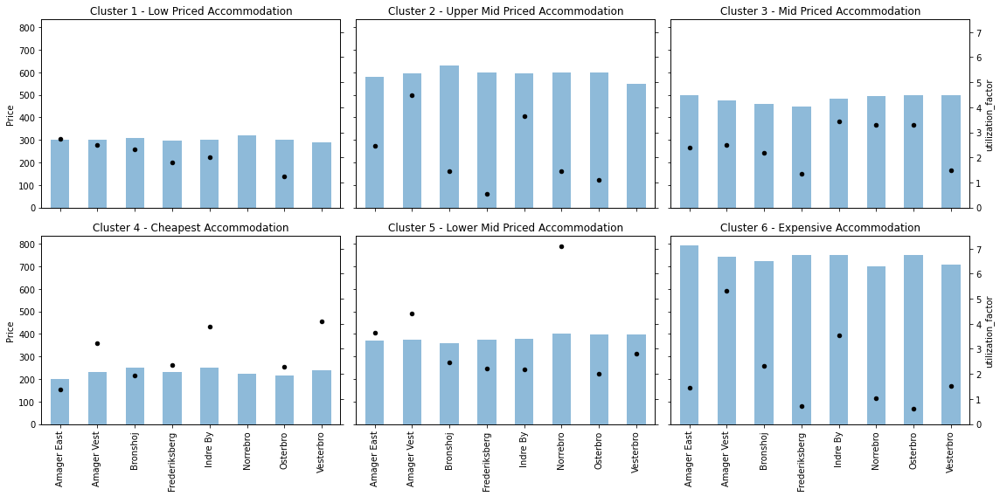

In [1514]:
fig, axs = plt.subplots(2,3,figsize=(16,8),sharey=True,sharex=True)

room_grouped_1.price.plot(kind='bar',x='neighbourhood',alpha=0.5,ax=axs[0,0])
ax1 = axs[0,0].twinx()
ax1.yaxis.label.set_visible(False)
ax1.yaxis.set_ticklabels([])
ax1.set_ylim(0,7.5)
axs[0,0].set_title('Cluster 1 - Low Priced Accommodation')
axs[0,0].set_ylabel('Price')
room_grouped_1.plot(kind='scatter',x='neighbourhood',y='utilization_factor',ax=ax1,color='black')

room_grouped_2.price.plot(kind='bar',x='neighbourhood',alpha=0.5,ax=axs[0,1])
ax2 = axs[0,1].twinx()
ax2.yaxis.label.set_visible(False)
ax2.yaxis.set_ticklabels([])
ax2.set_ylim(0,7.5)
axs[0,1].set_title('Cluster 2 - Upper Mid Priced Accommodation')
room_grouped_2.plot(kind='scatter',x='neighbourhood',y='utilization_factor',ax=ax2,color='black')

room_grouped_3.price.plot(kind='bar',x='neighbourhood',alpha=0.5,ax=axs[0,2])
ax3 = axs[0,2].twinx()
ax3.set_ylim(0,7.5)
axs[0,2].set_title('Cluster 3 - Mid Priced Accommodation')
room_grouped_3.plot(kind='scatter',x='neighbourhood',y='utilization_factor',ax=ax3,color='black')

room_grouped_4.price.plot(kind='bar',x='neighbourhood',alpha=0.5,ax=axs[1,0])
ax4 = axs[1,0].twinx()
ax4.yaxis.label.set_visible(False)
ax4.yaxis.set_ticklabels([])
ax4.set_ylim(0,7.5)
axs[1,0].set_ylabel('Price')
axs[1,0].set_title('Cluster 4 - Cheapest Accommodation')
room_grouped_4.plot(kind='scatter',x='neighbourhood',y='utilization_factor',ax=ax4,color='black')

room_grouped_5.price.plot(kind='bar',x='neighbourhood',alpha=0.5,ax=axs[1,1])
ax5 = axs[1,1].twinx()
ax5.yaxis.label.set_visible(False)
ax5.yaxis.set_ticklabels([])
ax5.set_ylim(0,7.5)
axs[1,1].set_title('Cluster 5 - Lower Mid Priced Accommodation')
room_grouped_5.plot(kind='scatter',x='neighbourhood',y='utilization_factor',ax=ax5,color='black')

room_grouped_6.price.plot(kind='bar',x='neighbourhood',alpha=0.5,ax=axs[1,2])
ax6 = axs[1,2].twinx()
ax6.set_ylim(0,7.5)
axs[1,2].set_title('Cluster 6 - Expensive Accommodation')
room_grouped_6.plot(kind='scatter',x='neighbourhood',y='utilization_factor',ax=ax6,color='black')

fig.tight_layout()